# Self-contained notebook for plotting following plots:
### Dataset Count over Time Histogram, SBP over Time, Target Positions Plot, and Ridge Regression Performance over Time

## Libraries

In [2]:
import os
import pandas as pd
import numpy as np
from datetime import datetime
#import config
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import pdb
import os 
import sys

from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from scipy import stats

from collections import defaultdict
%matplotlib inline


## Data Loading and Prepration

In [3]:
outputdir = "C:\\Files\\UM\\ND\\SFN"
preprocessingdir = os.path.join("C:\\Files\\UM\\ND\\SFN","preprocessing_092024_no7822nofalcon")
characterizationdir = outputdir

In [4]:
def get_good_days():
    # review_results = pd.read_csv(config.reviewpath)
    # # filter out bad days
    # good_days = review_results.loc[review_results['Status'] == 'good']

    # #create histogram for current version (fewer days I guess?)
    # dates = good_days['Date'].to_numpy()

    filenames = [f for f in os.listdir(preprocessingdir) if not f.startswith('.')] #in case there are any hidden files
    filenames.remove('bad_days.txt')
    filenames.sort()
    dates = [file[0:10] for file in filenames]
    return dates

In [5]:
dates =  get_good_days()

## Dataset Count over Time Histogram

In [6]:
def create_time_plot(ds):

    ds = np.asarray([datetime.strptime(x, '%Y-%m-%d') for x in ds])

    fig, ax = plt.subplots(figsize=(10, 2), layout='constrained', dpi=1200)
    ax.hist(ds, bins=100, color='k')
    ax.spines[['right','top','left']].set_visible(False)
    ax.set(yticks=(0,5,10),title="Distribution of days included in v0.2",ylabel="# of days")
    ax.set_axisbelow(True)
    ax.grid(axis="y",zorder=10)

    fig.savefig(os.path.join(outputdir,f'dataset_timeline_v02.pdf'))

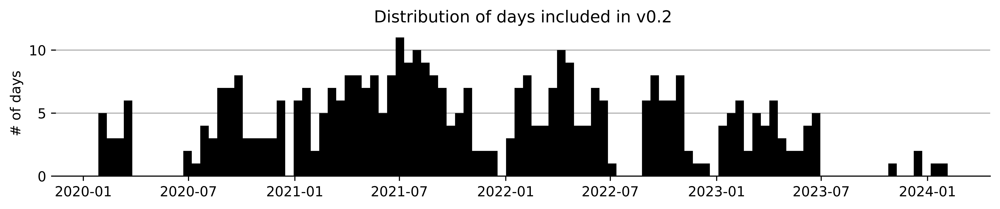

In [7]:
create_time_plot(dates)

x axis too messy?

## SBP over Time

First, sbps need to be calculated from data

In [8]:
def calc_avg_sbps(dates):
    sbp_avgs = pd.DataFrame(np.zeros((len(dates), 96), dtype=float), index=dates)
    sbp_avgs.index = pd.to_datetime(sbp_avgs.index)

    for date in dates:
        file = os.path.join(preprocessingdir,f'{date}_preprocess.pkl')

        with open(file, 'rb') as f:
            data_CO, data_RD = pickle.load(f)
        
        if data_CO and data_RD:
            sbp = np.concatenate((data_CO['sbp'], data_RD['sbp']),axis=0)
        elif data_RD:
            sbp = data_RD['sbp']
        else:
            sbp = data_CO['sbp']

        sbp_avgs.loc[date] = np.mean(sbp, axis=0)

    # once everything is in, take date out of index and make its own column
    #pdb.set_trace()
    sbp_avgs.to_csv(os.path.join(characterizationdir, "sbp_avgs.csv"))

In [9]:
calc_avg_sbps(dates)

Then, the sbps are plotted against time

In [10]:
def signal_power_over_time(dates, ax, crunch=True):

    if crunch:
        calc_avg_sbps(dates)
    
    sbp_avgs = pd.read_csv(os.path.join(characterizationdir, "sbp_avgs.csv"), index_col=0)
    sbp_avgs.index = pd.to_datetime(sbp_avgs.index)

    sbp_avgs['days'] = (sbp_avgs.index - sbp_avgs.index[0]).to_series().dt.days.to_numpy()

    sbp_long = sbp_avgs.reset_index(names="date").melt(id_vars=["date",'days'], var_name='channel', value_name='sbp')
    sbp_long['sbp'] = sbp_long['sbp']*0.25
    
    # plot average
    slope, intercept, r, p_val, sterr = stats.linregress(x=sbp_long['days'], y=sbp_long['sbp'])

    sns.regplot(data=sbp_long, x="days", y="sbp", marker='.', color='k', 
                line_kws={'color':'r'}, scatter_kws={'alpha':0.5}, ax=ax, label="Per-channel, single day averages")
    
    ax.annotate(f'slope: {slope:.3e} PR/day\nint: {intercept:.3f}\nr^2:{r**2:.3f},\np:{p_val:.3f}', (0, 10), ha='left')

    ax.set(xlabel='Day since first recording',
           ylabel='Mean SBP (uV)',
           title='SBP across channels over time',
           ylim=(0,70*.25),
           yticks=(0,4,8,16))

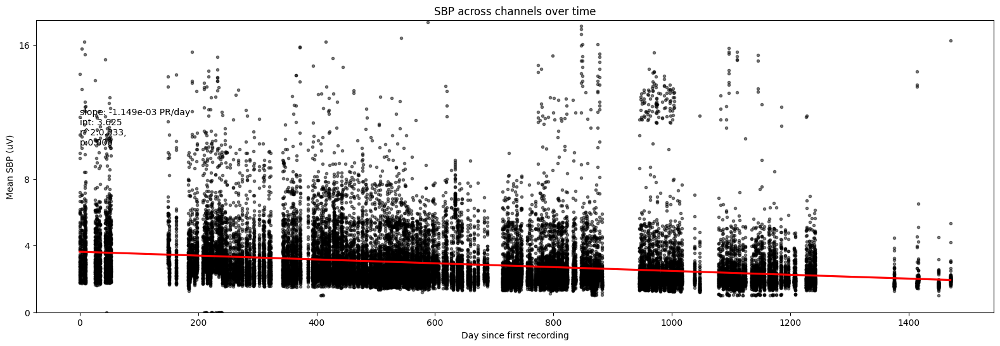

In [11]:
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_power_over_time(dates, ax, crunch=False)

### Channel-wise SBP visualization

In [12]:
def sbp_distributions_per_ch(ds, ch):
    distributions = []
    for date in ds:
        file = os.path.join(preprocessingdir,f'{date}_preprocess.pkl')

        with open(file, 'rb') as f:
            data_CO, data_RD = pickle.load(f)
        
        if data_CO and data_RD:
            sbp = np.concatenate((data_CO['sbp'], data_RD['sbp']),axis=0)[:,ch]
        elif data_RD:
            sbp = data_RD['sbp'][:,ch]
        else:
            sbp = data_CO['sbp'][:,ch]
        date_df = pd.DataFrame({
            'date': pd.to_datetime(date),
            'value': sbp
        })
        distributions.append(date_df)
    distributions_df = pd.concat(distributions, ignore_index=True)

    distributions_df.to_csv(os.path.join(characterizationdir, f"sbp_distributions_channel_{ch}.csv"), index=False)
    
def sbp_distributions(ds,channels):
    if isinstance(channels, int):
        ch_list = [channels]
        label = f"channel_{channels}"
    elif isinstance(channels, tuple) and len(channels) == 2:
        ch_start, ch_end = channels
        ch_list = list(range(ch_start, ch_end + 1))
        label = f"channel_{ch_start}-{ch_end}"
    elif isinstance(channels, list):
        ch_list = channels
        label = f"channel_{'_'.join(map(str, channels))}"

    distributions = []
    
    for date in ds:
        file = os.path.join(preprocessingdir, f'{date}_preprocess.pkl')

        with open(file, 'rb') as f:
            data_CO, data_RD = pickle.load(f)
        
        for ch in ch_list:
            if data_CO and data_RD:
                sbp = np.concatenate((data_CO['sbp'], data_RD['sbp']), axis=0)[:, ch]
            elif data_RD:
                sbp = data_RD['sbp'][:, ch]
                
            else:
                sbp = data_CO['sbp'][:, ch]
            
            date_df = pd.DataFrame({
                'date': pd.to_datetime(date),
                'value': sbp.reshape(-1)
            })
            distributions.append(date_df)
    
    distributions_df = pd.concat(distributions, ignore_index=True)
    
    distributions_df.to_csv(os.path.join(characterizationdir, f"sbp_distributions_{label}.csv"), index=False)
    
    return distributions_df

In [13]:
# for i in range(96):
#     print(f'channel {i}')
#     sbp_distributions_per_ch(dates, i)

In [22]:
def signal_distribution_per_ch(dates, ax, ch, n_bins=10, display_mean = True, display_median = True, show_trend=True,crunch=False,robust=True, percentile_range=(0.3,99.7)):

    file_path = os.path.join(characterizationdir, f"sbp_distributions_channel_{ch}.csv")

    try:
        sbp_avgs = pd.read_csv(file_path, index_col=0)
    except FileNotFoundError:
        print(f"Error: Channel {ch} average SBP data not found.")
        sbp_avgs = None

    if crunch or not os.path.exists(file_path):
        distribution_df = sbp_distributions_per_ch(dates, ch)
    else:
        try:
            #print('loaded')
            distribution_df = pd.read_csv(file_path)
            distribution_df['date'] = pd.to_datetime(distribution_df['date'])
        except FileNotFoundError:
            print(f"Error: Channel {ch} distribution data not found. Generating using sbp_distributions_per_ch.")
            distribution_df = sbp_distributions_per_ch(dates, ch)

    if ax is None:
        fig, ax = plt.subplots(figsize=(10,6))
    
    distribution_df['days'] = (distribution_df['date'] - distribution_df['date'].min()).dt.days
    
    if robust:
        # low_val = np.percentile(distribution_df['value'], percentile_range[0])
        # high_val = np.percentile(distribution_df['value'], percentile_range[1])
        low_val = 4.
        high_val = 30.
    else:
        low_val = distribution_df['value'].min() # outliers mess this up, use percentile instead
        high_val = distribution_df['value'].max()
    
    bins = np.linspace(low_val, high_val, n_bins + 1)
    bin_labels = [f'{bins[i]:.1f}-{bins[i+1]:.1f}' for i in range(n_bins)]
    bin_labels = bin_labels[::-1]

    days = sorted(distribution_df['days'].unique())
    date_labels = [pd.to_datetime(dates)[list(days).index(d)].strftime('%Y-%m-%d') 
                   if d in days else None for d in days]
    
    heatmap_data = np.zeros((n_bins, len(days)))
    
    for i, day in enumerate(days):
        day_data = distribution_df[distribution_df['days'] == day]['value']
        
        hist, _ = np.histogram(day_data, bins=np.concatenate([[-np.inf], bins[1:-1], [np.inf]]), density=False)

        heatmap_data[:, i] = hist[::-1]
    
    heatmap_df = pd.DataFrame(heatmap_data, index=bin_labels, columns=date_labels)
    
    sns.heatmap(
        heatmap_df, 
        annot=False, 
        cbar_kws={'label': 'Freq'},
        cmap="Blues",
        ax=ax,
        robust=robust
    )
    
    ax.set_title(f'SBP Distribution Heatmap for Channel {ch} Over Time')
    ax.set_ylabel('SBP Value Bins (uV)')
    ax.set_xlabel('Date')

    day_means = [distribution_df[distribution_df['days'] == day]['value'].mean() for day in days]
    mean_positions = [n_bins - 1 - ((m - low_val) / (high_val - low_val) * (n_bins - 1)) + 0.5 for m in day_means]
    
    day_medians = [distribution_df[distribution_df['days'] == day]['value'].median() for day in days]
    median_positions = [n_bins - 1 - ((m - low_val) / (high_val - low_val) * (n_bins - 1)) + 0.5 for m in day_medians]
    
    handles, labels = [], []
    
    if display_mean:
        for i, mean_pos in enumerate(mean_positions):
            x_pos = i + 0.5
            ax.plot(x_pos, mean_pos, marker='o', color='red', label='Mean' if i == 0 else "")
        
        handles.append(plt.Line2D([0], [0], marker='o', color='red', linestyle='None'))
        labels.append('Mean')
        
        if show_trend and len(days) > 1:
            x_positions = np.arange(len(days)) + 0.5
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_positions, mean_positions)
            
            trend_x = np.array([0, len(days)])
            trend_y = intercept + slope * trend_x
            
            mean_trend_line = ax.plot(trend_x, trend_y, color='black',linestyle='--', linewidth=1.5)
            
            sbp_range = high_val - low_val
            bin_range = n_bins - 1
            mean_sbp_slope = -slope * (sbp_range / bin_range)
            mean_sbp_intercept = high_val - (intercept - 0.5) * (sbp_range / bin_range)

            handles.append(plt.Line2D([0], [0], color='black', linestyle='--', linewidth=1.5))
            labels.append(f'Mean Trend (r^2={r_value**2:.3f}; Mean Slope: {mean_sbp_slope:.4f} uV/day; Intercept: {mean_sbp_intercept:.4f}; p-value: {p_value:.4f})')

    if display_median:
        for i, median_pos in enumerate(median_positions):
            x_pos = i + 0.5
            ax.plot(x_pos, median_pos, marker='o', color='orange', label='Median' if i == 0 else "")
        
        handles.append(plt.Line2D([0], [0], marker='o', color='orange', linestyle='None'))
        labels.append('Median')
        
        if show_trend and len(days) > 1:
            x_positions = np.arange(len(days)) + 0.5
            slope, intercept, r_value, p_value, std_err = stats.linregress(x_positions, median_positions)
            
            trend_x = np.array([0, len(days)])
            trend_y = intercept + slope * trend_x
            sbp_range = high_val - low_val
            bin_range = n_bins - 1
            median_sbp_slope = -slope * (sbp_range / bin_range)
            median_sbp_intercept = high_val - (intercept - 0.5) * (sbp_range / bin_range)

            
            median_trend_line = ax.plot(trend_x, trend_y, 'black', linestyle='dotted', linewidth=1.5)
            
            handles.append(plt.Line2D([0], [0], color='black', linestyle='dotted', linewidth=1.5))
            labels.append(f'Median Trend (r^2={r_value**2:.3f}; Median Slope: {median_sbp_slope:.4f} uV/day; Intercept: {median_sbp_intercept:.4f}; p-value: {p_value:.4f})')
    
    if handles:
        ax.legend(handles, labels, loc='upper right', framealpha=0.7)
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    return ax


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


C:\Users\chang\AppData\Local\Temp\ipykernel_21708\2979014924.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)


21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95


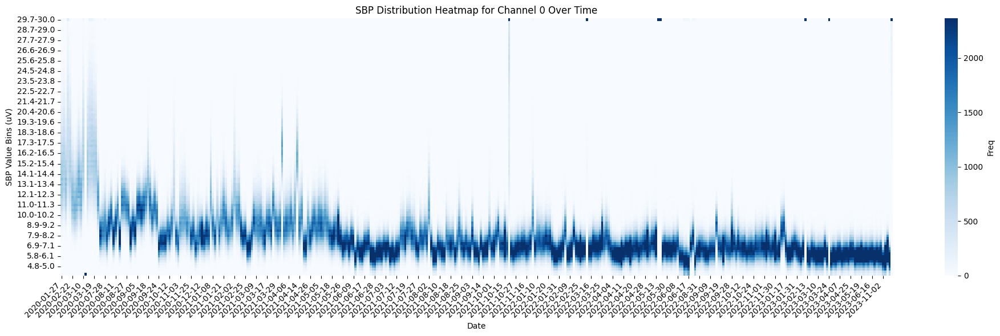

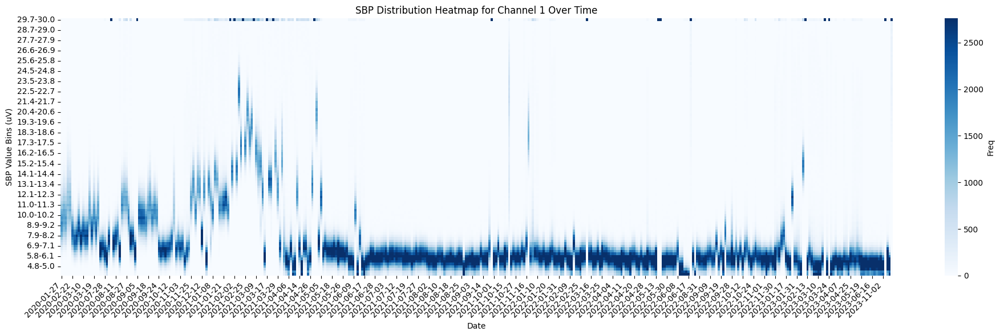

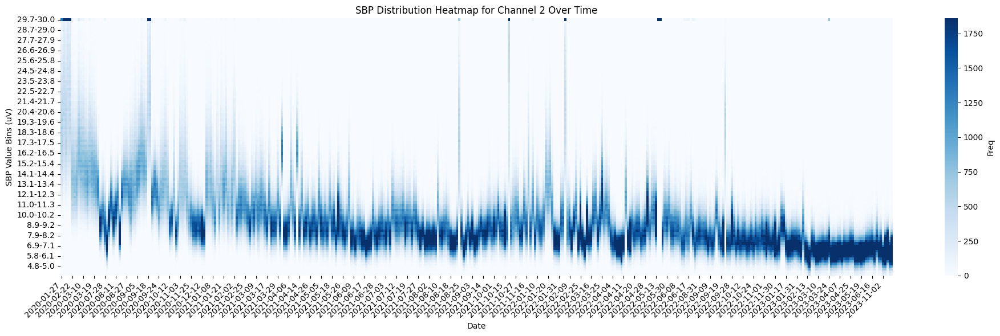

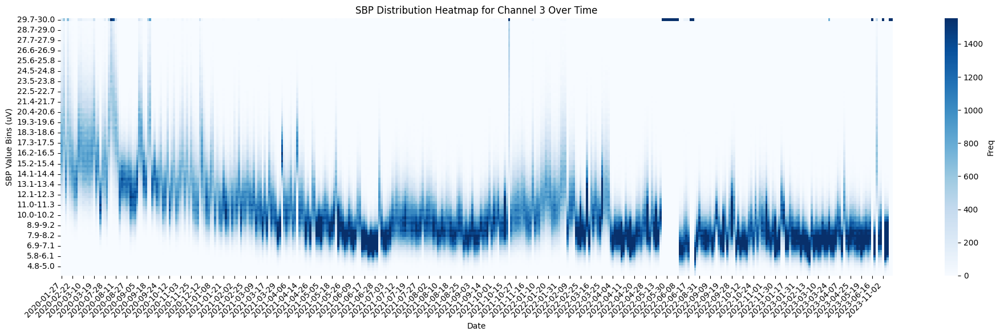

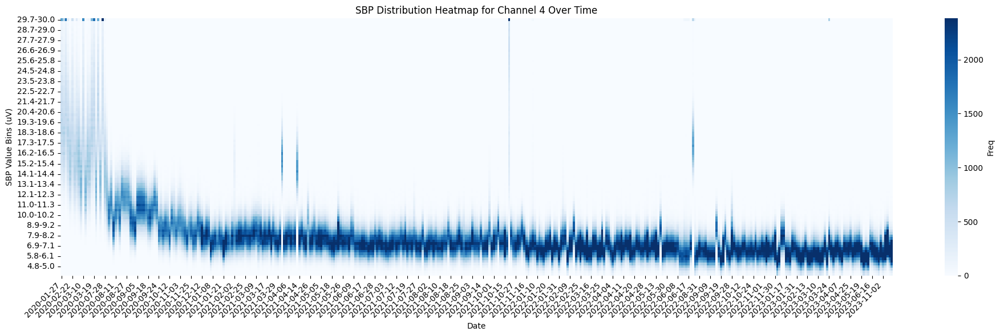

...

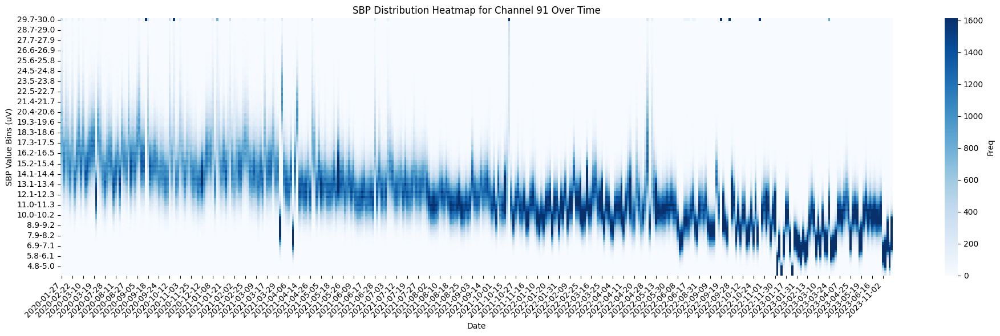

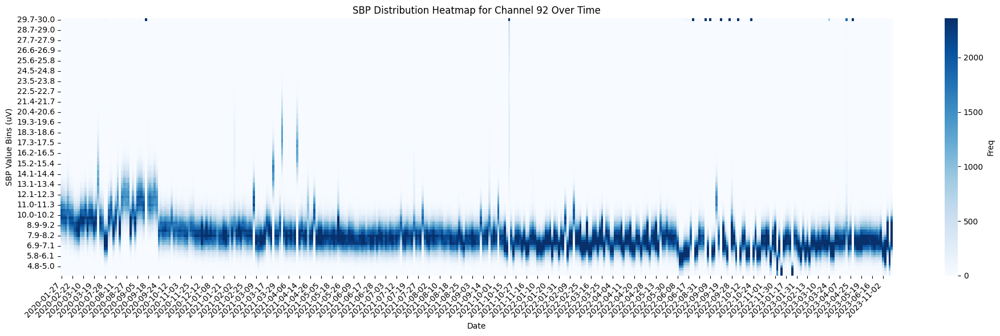

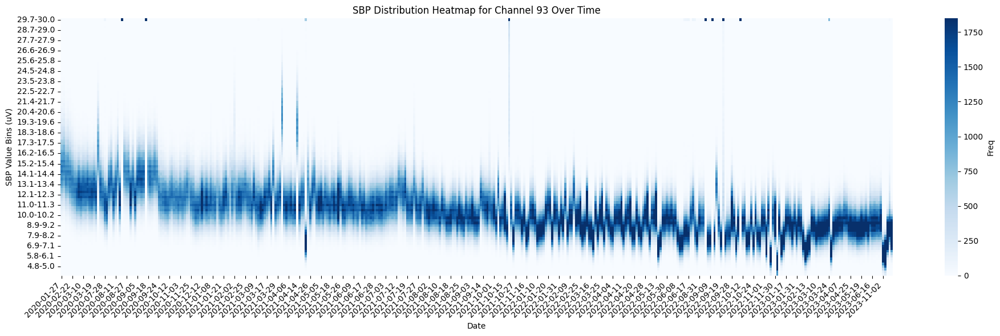

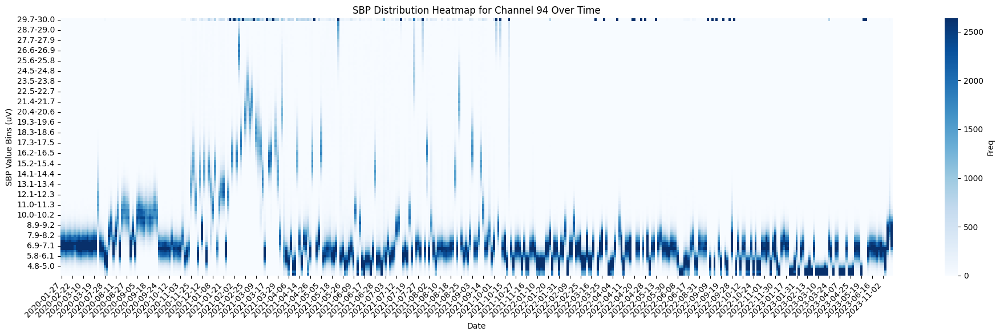

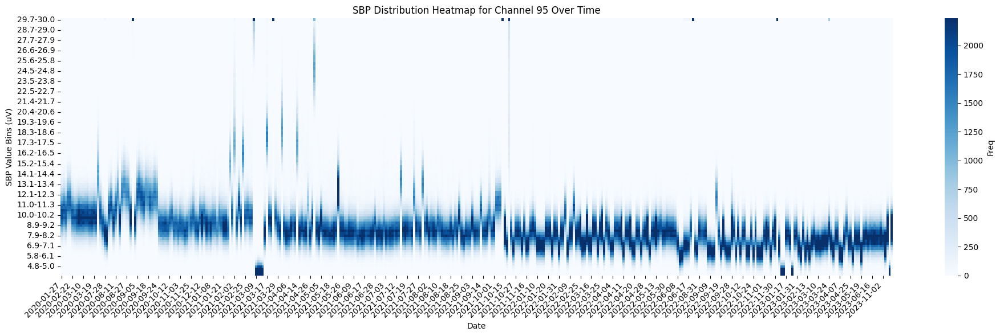

In [23]:
for i in range(96):
    print(i)
    fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
    signal_distribution_per_ch(dates, ax,i,100,display_mean=False,display_median=False, crunch=False)
    plt.savefig(os.path.join(characterizationdir, f"sbp_distributions_{i}_same.png"))

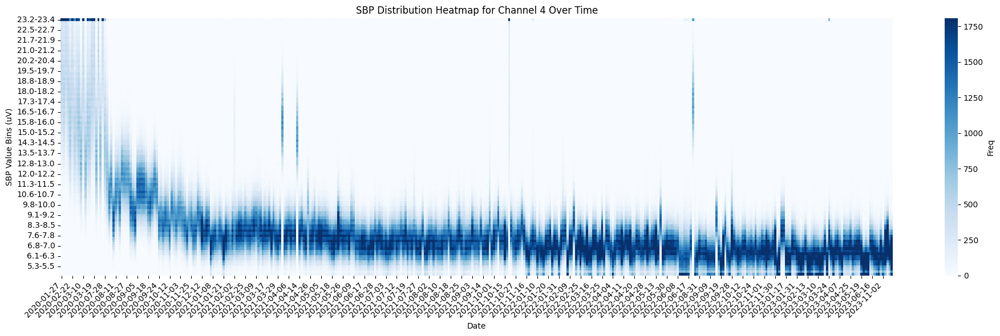

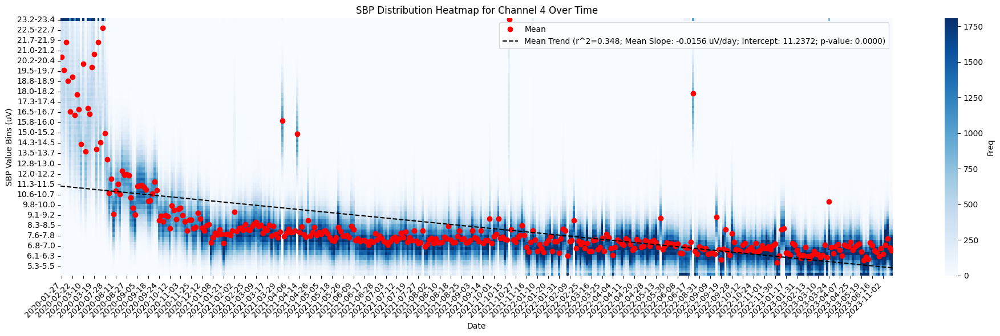

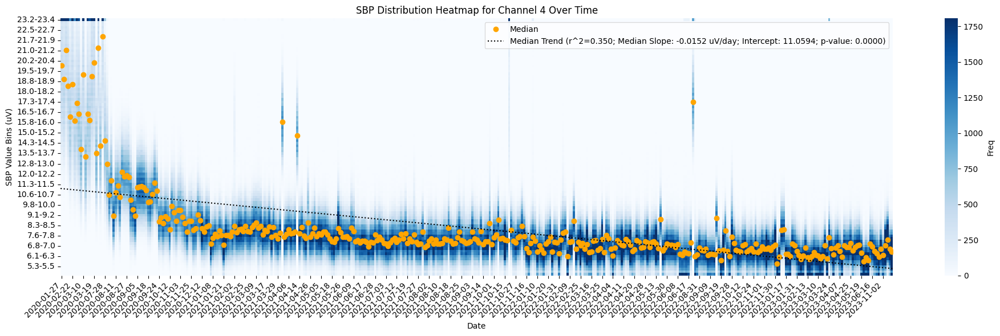

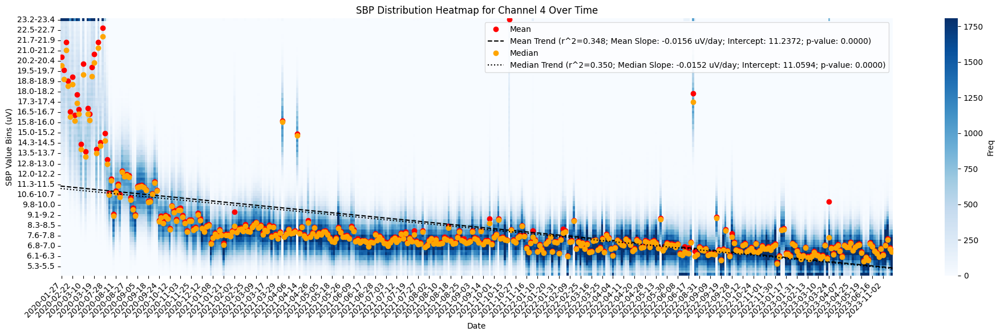

In [188]:
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,4,100,display_mean=False,display_median=False, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,4,100,display_mean=True,display_median=False, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,4,100,display_mean=False,display_median=True, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,4,100,display_mean=True,display_median=True, crunch=False)
plt.show()

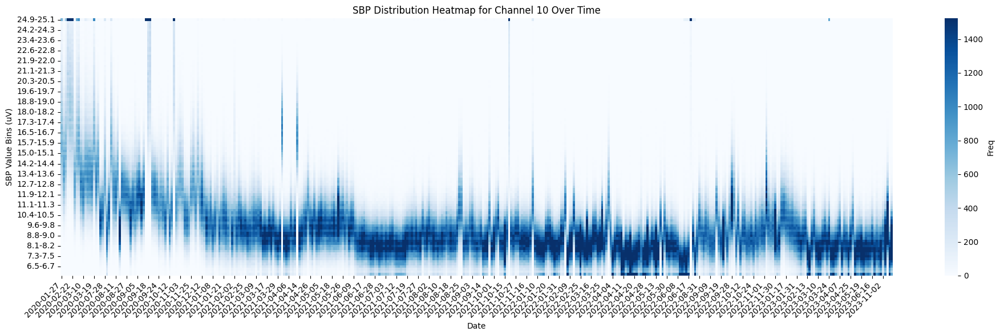

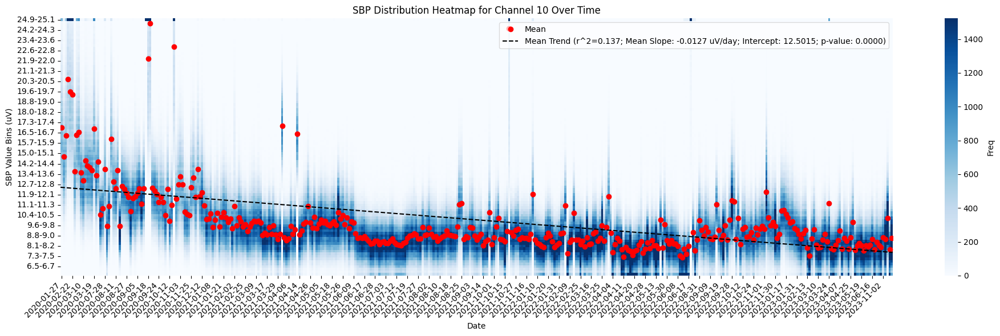

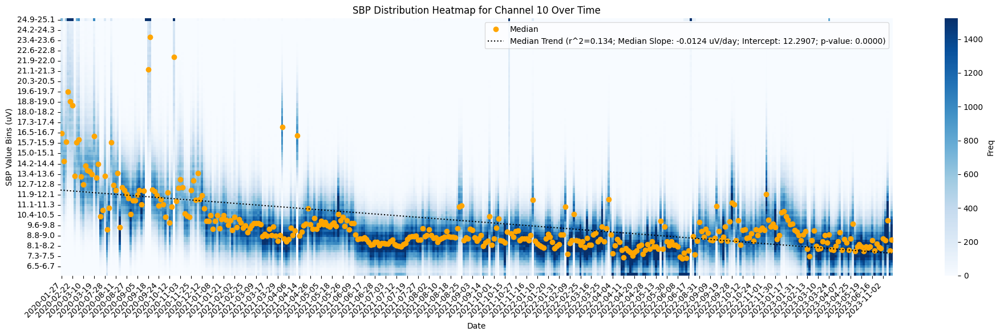

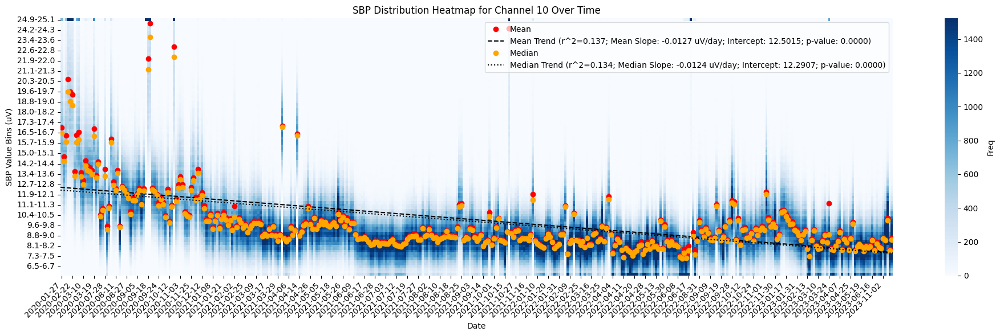

In [189]:
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,10,100,display_mean=False,display_median=False, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,10,100,display_mean=True,display_median=False, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,10,100,display_mean=False,display_median=True, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,10,100,display_mean=True,display_median=True, crunch=False)
plt.show()

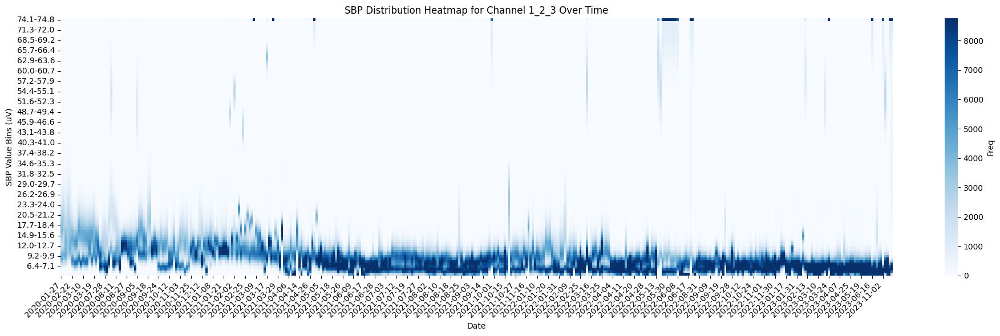

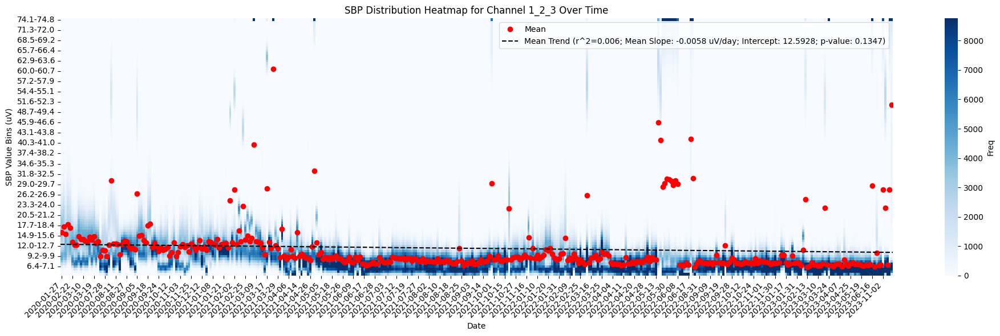

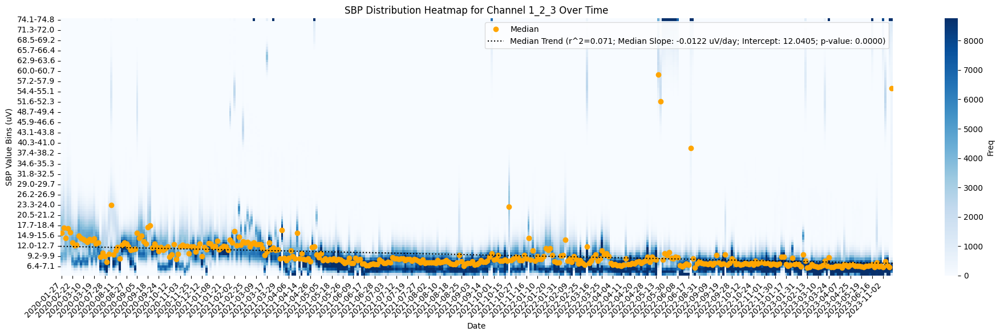

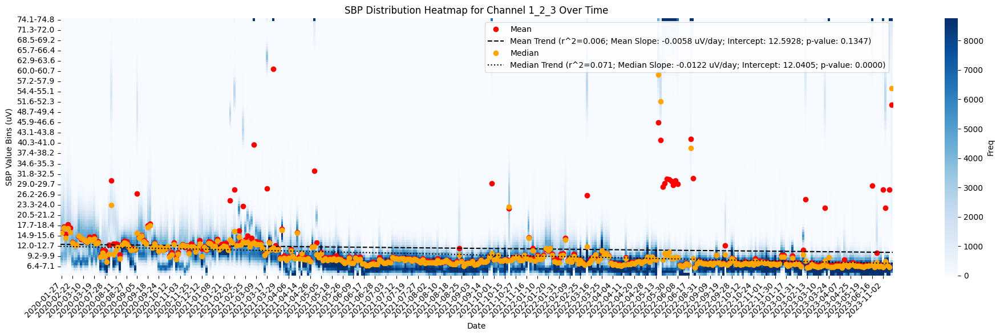

In [187]:
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,'1_2_3',100,display_mean=False,display_median=False, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,'1_2_3',100,display_mean=True,display_median=False, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,'1_2_3',100,display_mean=False,display_median=True, crunch=False)
plt.show()
fig, ax = plt.subplots(1, 1, figsize = (19.5, 6), sharex=True)
signal_distribution_per_ch(dates, ax,'1_2_3',100,display_mean=True,display_median=True, crunch=False)
plt.show()

## Target Positions Plot

TODO: i plotted all target positions for all trials, not sure if its the way desired, check this

First, all positions are extracted from trials and concatenated together

In [193]:
targetpos_co = np.zeros((1,2))
targetpos_rd = np.zeros((1,2))
for date in dates[0:]:
    # file = os.path.join(preprocessingdir,f'{date}_preprocess.pkl')

    # with open(file, 'rb') as f:
    #     data_CO, data_RD = pickle.load(f)
    
    # if data_CO and data_RD:
    #     targetpos_co = np.concatenate((targetpos_co, data_CO['target_positions']),axis=0)
    #     targetpos_rd = np.concatenate((targetpos_rd, data_RD['target_positions']),axis=0)
    # elif data_RD:
    #     targetpos_rd = np.concatenate((targetpos_rd, data_RD['target_positions']),axis=0)
    # else:
    #     targetpos_co = np.concatenate((targetpos_co, data_CO['target_positions']),axis=0)

# switch to these for one day plotting
    selectedDateIdx = 3
    date = dates[selectedDateIdx]
    file = os.path.join(preprocessingdir,f'{date}_preprocess.pkl')

    with open(file, 'rb') as f:
        data_CO, data_RD = pickle.load(f)

    if data_CO and data_RD:
        targetpos_co = np.concatenate((targetpos_co, data_CO['target_positions']),axis=0)
        targetpos_rd = np.concatenate((targetpos_rd, data_RD['target_positions']),axis=0)
    elif data_RD:
        targetpos_rd = np.concatenate((targetpos_rd, data_RD['target_positions']),axis=0)
    else:
        targetpos_co = np.concatenate((targetpos_co, data_CO['target_positions']),axis=0)


then they are plotted

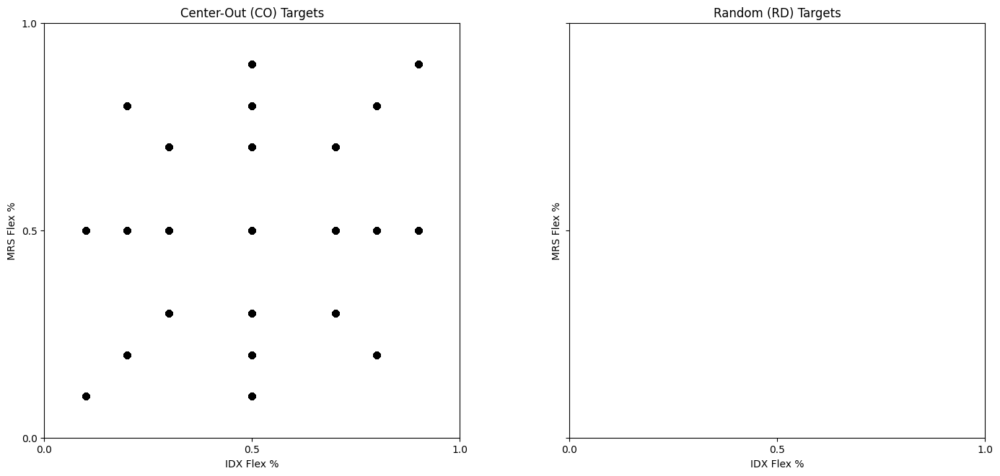

In [194]:

fig, ax = plt.subplots(1,2, figsize=(14.5, 6.5), layout='constrained', sharex=True, sharey=True)

title = ('Center-Out (CO)','Random (RD)')

ax[0].scatter(targetpos_co[1:,0],targetpos_co[1:,1],c='k')
ax[0].set_box_aspect(1)
ax[0].set(yticks=(0,0.5,1),
        xticks=(0,0.5,1),
        title=f'{title[0]} Targets',
        xlabel='IDX Flex %',
        ylabel='MRS Flex %')

ax[1].scatter(targetpos_rd[1:,0],targetpos_rd[1:,1],c='k')
ax[1].set_box_aspect(1)
ax[1].set(yticks=(0,0.5,1),
        xticks=(0,0.5,1),
        title=f'{title[1]} Targets',
        xlabel='IDX Flex %',
        ylabel='MRS Flex %')
    
fig.savefig(os.path.join(outputdir, "targpos.pdf"))

## Ridge Regression Performance over Time

### helper functions

In [27]:
def adjustfeats(X, Y, lag=0, hist=0, fillb4=None, out2d=False):
    '''
    This function takes in neural data X and behavior Y and returns two "adjusted" neural data and behavior matrices
    based on the optional params. Specifically the amount of lag between neural data and behavior can be set in units
    and the number of historical bins of neural data can be set. (BASED ON CODE BY SAM NASON)
    Inputs:
        - X (ndarray):
            The neural data, which should be [t, neu] in size, where t is the numebr of smaples and neu is the number
            of neurons.
        - y (ndarray):
            The behavioral data, which should be [t, dim] in size, where t is the number of samples and dim is the
            number of states.
        - lag (int, optional):
            Defaults to 0. The number of bins to lag the neural data relative to the behavioral data. For example,
            adjustFeats(X,Y, lag=1) will return X[0:-1] for adjX and Y[1:] for adjY.
        - hist (int, optional):
            Default 0. The number of bins to append to each sample of neural data from the previous 'hist' bins.
        - fillb4 (ndarray or scalar, optional):
            Default None, disabled. This fills previous neural data with values before the experiment began. A single
            scalar wil fill all previous neural data with that value. Otherwise, a [1,neu] ndarray equal to the first
            dimension of X (# of neurons) should represent the value to fill for each channel.
        - out2d (bool, optional):
            if history is added, will return the adjusted matrices either in 2d or 3d form (2d has the history appended
            as extra columns, 3d has history as a third dimension. For example, out2d true returns a sample as:
            [1, neu*hist+1] whereas out2d false returns: [1, neu, hist+1]. Default False
    Outputs:
        - adjX (ndarray):
            The adjusted neural data
        - adjY (ndarray):
            The adjusted behavioral data
    '''
    nNeu = X.shape[1]
    if fillb4 is not None:
        if isinstance(fillb4, np.ndarray):
            Xadd = np.tile(fillb4, hist)
            Yadd = np.zeros((hist, Y.shape[1]))
        else:
            Xadd = np.ones((hist, nNeu))*fillb4
            Yadd = np.zeros((hist, Y.shape[1]))
        X = np.concatenate((Xadd, X))
        Y = np.concatenate((Yadd, Y))

    #reshape data to include historical bins
    adjX = np.zeros((X.shape[0]-hist, nNeu, hist+1))
    for h in range(hist+1):
        adjX[:,:,h] = X[h:X.shape[0]-hist+h,:]
    adjY = Y[hist:,:]

    if lag != 0:
        adjX = adjX[0:-lag,:,:]
        adjY = adjY[lag:,:]

    if out2d:
        #NOTE: History will be succesive to each column (ie with history 5, columns 0-5 will be channel 1, 6-10
        # channel 2, etc..
        adjX = adjX.reshape(adjX.shape[0],-1)

    return adjX, adjY

In [28]:
def dataPrep(feats, hist, numChans=96):
    '''
    Get test and training data splits from a single session - also prep 2D and 3D versions

    '''
    TrialIndex = feats['trial_index']
    
    if len(TrialIndex) > 300:
        test_len = np.min((len(TrialIndex)-1, 399))

        # neural_training = feats['NeuralFeature'][:TrialIndex[300]]
        # neural_testing = feats['NeuralFeature'][TrialIndex[300]:TrialIndex[test_len]]

        # finger_training = feats['FingerAnglesTIMRL'][:TrialIndex[300]]
        # finger_testing = feats['FingerAnglesTIMRL'][TrialIndex[300]:TrialIndex[test_len]]

        neural_training = feats['sbp'][:TrialIndex[300]]
        neural_testing = feats['sbp'][TrialIndex[300]:TrialIndex[test_len]]

        finger_training = feats['finger_kinematics'][:TrialIndex[300]]
        finger_testing = feats['finger_kinematics'][TrialIndex[300]:TrialIndex[test_len]]

    else:
        pdb.set_trace()
        raise Exception('not enough trials')

        
    neural_training, finger_training = adjustfeats(neural_training, finger_training, hist = hist, out2d = True)
    neural_testing, finger_testing = adjustfeats(neural_testing, finger_testing, hist = hist, out2d = True)

    neural_testing = np.concatenate((neural_testing, np.ones((len(neural_testing), 1))), axis=1) # add a column of ones for RR
    neural_training = np.concatenate((neural_training, np.ones((len(neural_training), 1))), axis=1) # add a column of ones for RR

    return neural_training, neural_testing, finger_training, finger_testing

### train RR on day 0 and test on all following days

In [8]:
file = os.path.join(preprocessingdir,f'{dates[0]}_preprocess.pkl')

with open(file, 'rb') as f:
    data_CO, data_RD = pickle.load(f)

neural_train, neural_test, finger_train, finger_test = dataPrep(data_CO,4)

In [9]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
dates =  get_good_days()
reg = linear_model.Ridge(alpha = 0.001)
reg.fit(neural_train, finger_train)
rr_prediction = reg.predict(neural_test)
mses = mean_squared_error(finger_test, rr_prediction, multioutput = 'raw_values').reshape(1,4)
co_dates = np.array([dates[1]])
print(mses.shape)
print(type(co_dates))
print(co_dates)

(1, 4)
<class 'numpy.ndarray'>
['2020-01-30']


In [98]:
for date in dates[1:]:
    file = os.path.join(preprocessingdir,f'{date}_preprocess.pkl')
    sys.stdout.write(f"\r Date Processing: {date}")
    sys.stdout.flush()
    with open(file, 'rb') as f:
        data_CO, data_RD = pickle.load(f)
    
    if data_CO:
        neural_train, neural_test, finger_train, finger_test = dataPrep(data_CO,4)
        rr_prediction = reg.predict(neural_test)
        mses = np.concatenate((mses,mean_squared_error(finger_test, rr_prediction, multioutput = 'raw_values').reshape(1,4)),axis=0)


 Date Processing: 2024-02-05

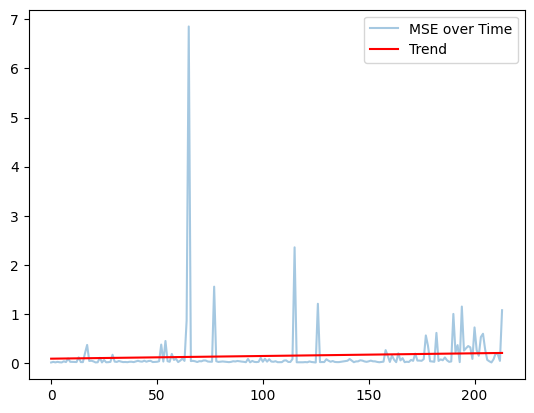

In [99]:
from scipy.ndimage import gaussian_filter

average_mses = mses.mean(axis=-1)
x = np.arange(len(average_mses))
slope, intercept = np.polyfit(x, average_mses, 1)
trend = slope * x + intercept

plt.plot(x, average_mses, label="MSE over Time", alpha=0.4)
plt.plot(x, trend, label="Trend", color="red")
plt.legend()
plt
plt.show()
#TODO: change this to actual time for x, modify the trace loop too

### train rr on every day and test on everyday

In [29]:
def adjustfeats(X, Y, lag=0, hist=0, fillb4=None, out2d=False):
    '''
    This function takes in neural data X and behavior Y and returns two "adjusted" neural data and behavior matrices
    based on the optional params. Specifically the amount of lag between neural data and behavior can be set in units
    and the number of historical bins of neural data can be set. (BASED ON CODE BY SAM NASON)
    Inputs:
        - X (ndarray):
            The neural data, which should be [t, neu] in size, where t is the numebr of smaples and neu is the number
            of neurons.
        - y (ndarray):
            The behavioral data, which should be [t, dim] in size, where t is the number of samples and dim is the
            number of states.
        - lag (int, optional):
            Defaults to 0. The number of bins to lag the neural data relative to the behavioral data. For example,
            adjustFeats(X,Y, lag=1) will return X[0:-1] for adjX and Y[1:] for adjY.
        - hist (int, optional):
            Default 0. The number of bins to append to each sample of neural data from the previous 'hist' bins.
        - fillb4 (ndarray or scalar, optional):
            Default None, disabled. This fills previous neural data with values before the experiment began. A single
            scalar wil fill all previous neural data with that value. Otherwise, a [1,neu] ndarray equal to the first
            dimension of X (# of neurons) should represent the value to fill for each channel.
        - out2d (bool, optional):
            if history is added, will return the adjusted matrices either in 2d or 3d form (2d has the history appended
            as extra columns, 3d has history as a third dimension. For example, out2d true returns a sample as:
            [1, neu*hist+1] whereas out2d false returns: [1, neu, hist+1]. Default False
    Outputs:
        - adjX (ndarray):
            The adjusted neural data
        - adjY (ndarray):
            The adjusted behavioral data
    '''
    nNeu = X.shape[1]
    if fillb4 is not None:
        if isinstance(fillb4, np.ndarray):
            Xadd = np.tile(fillb4, hist)
            Yadd = np.zeros((hist, Y.shape[1]))
        else:
            Xadd = np.ones((hist, nNeu))*fillb4
            Yadd = np.zeros((hist, Y.shape[1]))
        X = np.concatenate((Xadd, X))
        Y = np.concatenate((Yadd, Y))

    #reshape data to include historical bins
    adjX = np.zeros((X.shape[0]-hist, nNeu, hist+1))
    for h in range(hist+1):
        adjX[:,:,h] = X[h:X.shape[0]-hist+h,:]
    adjY = Y[hist:,:]

    if lag != 0:
        adjX = adjX[0:-lag,:,:]
        adjY = adjY[lag:,:]

    if out2d:
        #NOTE: History will be succesive to each column (ie with history 5, columns 0-5 will be channel 1, 6-10
        # channel 2, etc..
        adjX = adjX.reshape(adjX.shape[0],-1)

    return adjX, adjY

In [66]:


from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import pearsonr


mses = np.zeros((1,4))
r2s = np.zeros((1,1))
rs = np.zeros((1,4))

for date in dates:
    file = os.path.join(preprocessingdir,f'{date}_preprocess.pkl')

    with open(file, 'rb') as f:
        data_CO, data_RD = pickle.load(f)
    sys.stdout.write(f"\r Date Processing: {date}")
    sys.stdout.flush()

    if data_CO and data_RD:
        neural_train, neural_test, finger_train, finger_test = dataPrep(data_CO,20)
        reg = linear_model.Ridge(alpha = 0.001)
        reg.fit(neural_train, finger_train)
        rr_prediction = reg.predict(neural_test)
        mses_co = mean_squared_error(finger_test, rr_prediction, multioutput = 'raw_values').reshape(1,4)
        r2s_co = np.array([r2_score(finger_test, rr_prediction)]).reshape(1,1)
        rs_co = np.array([pearsonr(finger_test, rr_prediction).statistic]).reshape(1,4)

        neural_train, neural_test, finger_train, finger_test = dataPrep(data_RD,20)
        reg = linear_model.Ridge(alpha = 0.001)
        reg.fit(neural_train, finger_train)
        rr_prediction = reg.predict(neural_test)
        mses = np.concatenate((mses,(mean_squared_error(finger_test, rr_prediction, multioutput = 'raw_values').reshape(1,4) + mses_co)/2),axis=0)
        r2s = np.concatenate((r2s,(np.array([r2_score(finger_test, rr_prediction)]).reshape(1,1)+r2s_co)/2),axis=0)
        rs = np.concatenate((rs,(np.array([pearsonr(finger_test, rr_prediction).statistic]).reshape(1,4)+rs_co)/2),axis=0)

    elif data_CO:
        neural_train, neural_test, finger_train, finger_test = dataPrep(data_CO,20)
        reg = linear_model.Ridge(alpha = 0.001)
        reg.fit(neural_train, finger_train)
        rr_prediction = reg.predict(neural_test)
        mses = np.concatenate((mses,mean_squared_error(finger_test, rr_prediction, multioutput = 'raw_values').reshape(1,4)),axis=0)
        r2s = np.concatenate((r2s,np.array([r2_score(finger_test, rr_prediction)]).reshape(1,1)),axis=0)
        rs = np.concatenate((rs,np.array([pearsonr(finger_test, rr_prediction).statistic]).reshape(1,4)),axis=0)

    elif data_RD:
        neural_train, neural_test, finger_train, finger_test = dataPrep(data_RD,20)
        reg = linear_model.Ridge(alpha = 0.001)
        reg.fit(neural_train, finger_train)
        rr_prediction = reg.predict(neural_test)
        mses = np.concatenate((mses,mean_squared_error(finger_test, rr_prediction, multioutput = 'raw_values').reshape(1,4)),axis=0)
        r2s = np.concatenate((r2s,np.array([r2_score(finger_test, rr_prediction)]).reshape(1,1)),axis=0)
        rs = np.concatenate((rs,np.array([pearsonr(finger_test, rr_prediction).statistic]).reshape(1,4)),axis=0)

 Date Processing: 2024-02-05

In [67]:
print(len(dates))

385


In [68]:
date_objects = [datetime.strptime(date_str, '%Y-%m-%d') for date_str in dates]
first_date = date_objects[0]
days_from_first = [(date - first_date).days for date in date_objects]


(385,)
385


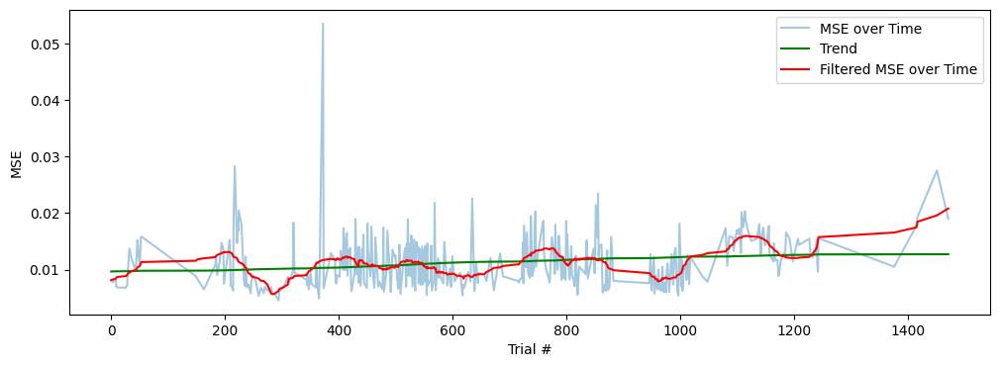

(386, 1)


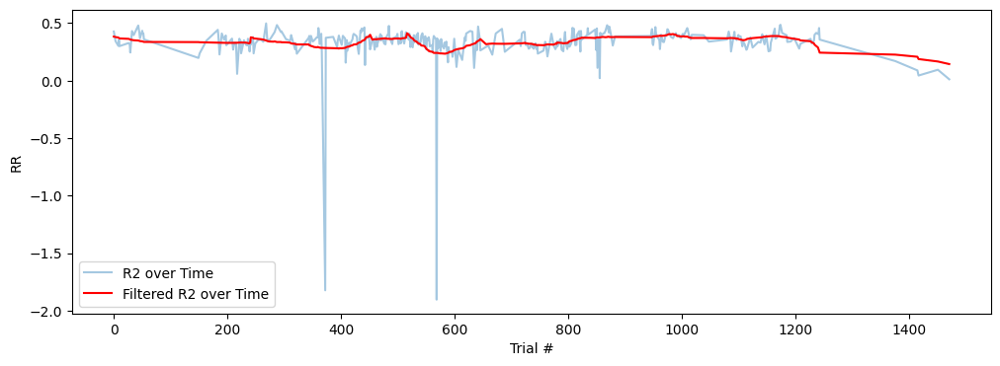

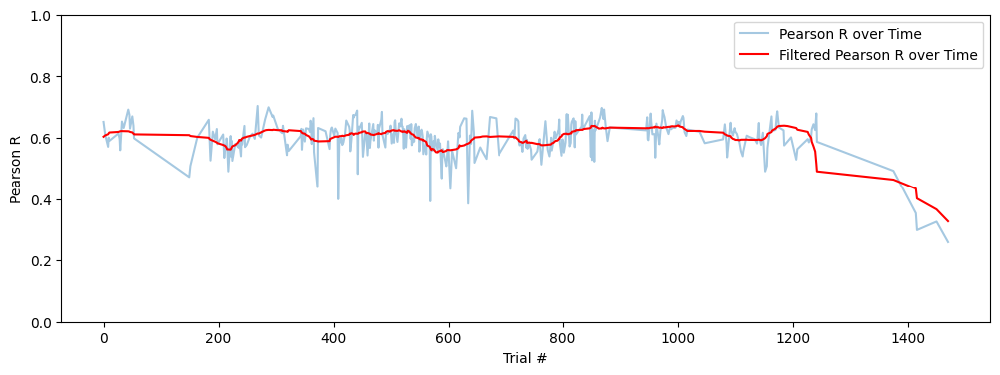

In [70]:
from scipy.ndimage import gaussian_filter
from scipy.signal import savgol_filter
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

r2s_reshaped = r2s[1:,:].reshape(-1, 1)
r2s_normalized = scaler.fit_transform(r2s_reshaped)

average_mses = mses[1:,:].mean(axis=-1)
x = np.arange(len(average_mses))
print(x.shape)
print(len(days_from_first))
x2 = np.arange(len(r2s_normalized))



slope, intercept = np.polyfit(x, average_mses, 1)
trend = slope * x + intercept
plt.figure(figsize=(12, 4))
plt.plot(days_from_first, average_mses, label="MSE over Time", alpha=0.4)
plt.plot(days_from_first, trend, label="Trend", color="green")
plt.plot(days_from_first, savgol_filter(average_mses.flatten(), 50, 3), label="Filtered MSE over Time", color="red")
plt.xlabel('Trial #')
plt.ylabel('MSE')
plt.legend()
plt.show()

plt.figure(figsize=(12, 4))
#TODO: change this to actual time for x, modify the trace loop too
print(r2s.shape)
plt.plot(days_from_first, r2s[1:,:].flatten(), label="R2 over Time", alpha=0.4)
plt.plot(days_from_first, savgol_filter(r2s[1:,:].flatten(), 70, 3), label="Filtered R2 over Time", color="red")
plt.legend()
plt.xlabel('Trial #')
plt.ylabel('RR')
plt.show()

average_rs = rs[1:,:].mean(axis=-1)
x3 = np.arange(len(average_rs))
plt.figure(figsize=(12, 4))
plt.plot(days_from_first, average_rs, label="Pearson R over Time", alpha=0.4)
plt.plot(days_from_first, savgol_filter(average_rs, 50, 3), label="Filtered Pearson R over Time", color="red")
plt.legend()
plt.ylim((0,1))
plt.xlabel('Trial #')
plt.ylabel('Pearson R')
plt.show()

In [71]:
rr_perfs = np.load('sfn_stuff\\rr_perfs.npy')
loaded_dates_np = np.load('sfn_stuff\\dates.npy')
rr_data = np.diagonal(rr_perfs, axis1=0, axis2=1) # Extract diagonal (same day performances)

first_date_origin = loaded_dates_np[0]

days_from_first_origin = (loaded_dates_np - first_date_origin).astype(int)
print(rr_data.shape)

(4, 253)


Text(0, 0.5, 'Pearson R')

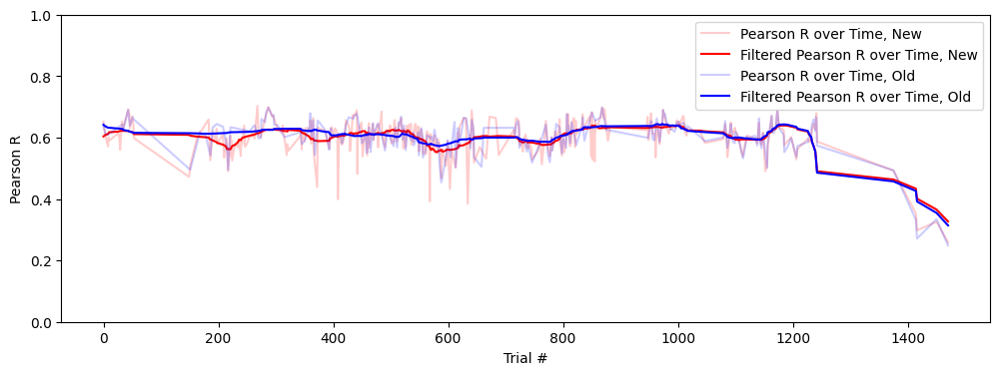

In [72]:
average_rs = rs[1:,:].mean(axis=-1)
average_rs_origin = rr_data[:,:].mean(axis=0)
plt.figure(figsize=(12, 4))
plt.plot(days_from_first, average_rs, label="Pearson R over Time, New", color="red", alpha=0.2)
plt.plot(days_from_first, savgol_filter(average_rs, 50, 3), label="Filtered Pearson R over Time, New", color="red")
plt.plot(days_from_first_origin, average_rs_origin, label="Pearson R over Time, Old", color="blue", alpha=0.2)
plt.plot(days_from_first_origin, savgol_filter(average_rs_origin, 50, 3), label="Filtered Pearson R over Time, Old", color="blue")
plt.legend()
plt.ylim((0,1))
plt.xlabel('Trial #')
plt.ylabel('Pearson R')

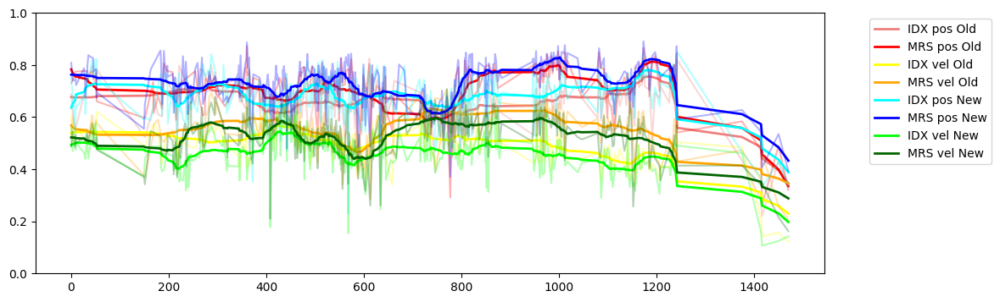

In [94]:
labels = ('IDX pos Old','MRS pos Old','IDX vel Old','MRS vel Old')
colors = ('lightcoral','red','yellow','orange')
plt.figure(figsize=(12, 4))
for i in range(rr_data.shape[0]):
    plt.plot(days_from_first_origin, rr_data[i,:], c=colors[i], alpha=0.3)
    plt.plot(days_from_first_origin, savgol_filter(rr_data[i,:], 50, 3), label=f'{labels[i]}', c=colors[i], lw=2)
    plt.ylim(0,1)

labels = ('IDX pos New','MRS pos New','IDX vel New','MRS vel New')
colors = ('aqua','blue','lime','darkgreen')
for i in range(rs.shape[-1]):
    plt.plot(days_from_first, rs[1:,i], c=colors[i], alpha=0.3)
    plt.plot(days_from_first, savgol_filter(rs[1:,i], 50, 3), label=f'{labels[i]}', c=colors[i], lw=2)
    plt.ylim(0,1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


### focus on the last several samples (350-400)

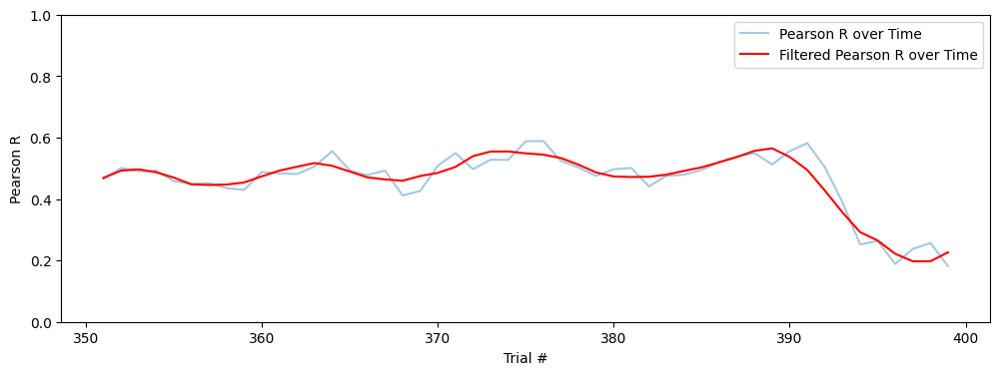

In [12]:
average_rs = rs[1:,:].mean(axis=-1)
x3 = np.arange(len(average_rs))
plt.figure(figsize=(12, 4))
plt.plot(x3[-50:-1], average_rs[-50:-1], label="Pearson R over Time", alpha=0.4)
plt.plot(x3[-50:-1], savgol_filter(average_rs[-50:-1], 10, 3), label="Filtered Pearson R over Time", color="red")
plt.legend()
plt.xlabel('Trial #')
plt.ylabel('Pearson R')
plt.ylim((0,1))
plt.show()

### remove outliers smaller than 0 (probably not a good idea)

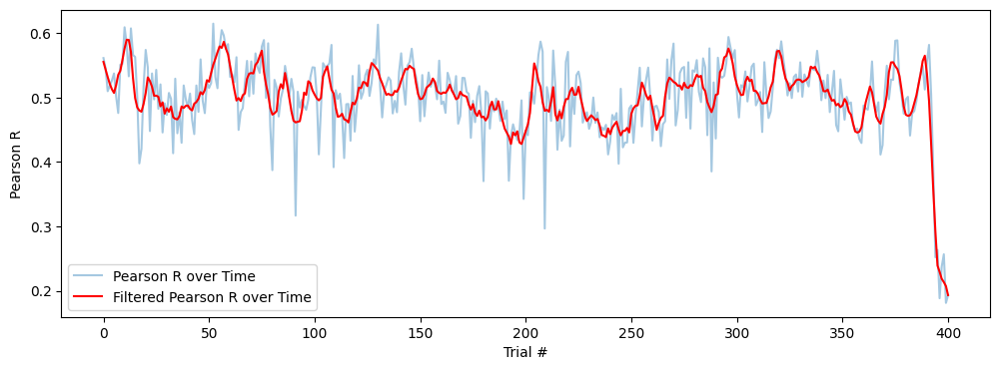

In [103]:
average_rs = rs[1:,:].mean(axis=-1)
outlier_removed_rs = average_rs[average_rs >0]
x3 = np.arange(len(outlier_removed_rs))
plt.figure(figsize=(12, 4))
plt.plot(x3, outlier_removed_rs, label="Pearson R over Time", alpha=0.4)
plt.plot(x3, savgol_filter(outlier_removed_rs, 10, 3), label="Filtered Pearson R over Time", color="red")
plt.legend()
plt.xlabel('Trial #')
plt.ylabel('Pearson R')
plt.show()